In [15]:
from vectorbtpro import *
# whats_imported()

vbt.settings.set_theme("dark")

In [16]:
# data = vbt.BinanceData.pull(
#     ["BTCUSDT", "ETHUSDT", "BNBUSDT", "XRPUSDT", "ADAUSDT"], 
#     start="2020-01-01 UTC", 
#     end="2021-01-01 UTC",
#     timeframe="1h"
# )

# data.to_hdf()

  0%|          | 0/5 [00:02<?, ?it/s, symbol=BTCUSDT]

3it [00:02,  1.16it/s, 2020-01-01 00:00 → 2020-05-05 06:00]

In [17]:
data = vbt.HDFData.pull("BinanceData.h5")

## Allocation

### Manually

#### Index points

In [18]:
ms_points = data.wrapper.get_index_points(every="M")
ms_points

array([   0,  744, 1434, 2177, 2895, 3639, 4356, 5100, 5844, 6564, 7308,
       8027])

In [19]:
data.wrapper.index.get_indexer(
    pd.Series(index=data.wrapper.index).resample(vbt.offset("M")).asfreq().index, 
    method="bfill"
)

array([   0,  744, 1434, 2177, 2895, 3639, 4356, 5100, 5844, 6564, 7308,
       8027])

In [20]:
data.wrapper.index[ms_points]

DatetimeIndex(['2020-01-01 00:00:00+00:00', '2020-02-01 00:00:00+00:00',
               '2020-03-01 00:00:00+00:00', '2020-04-01 00:00:00+00:00',
               '2020-05-01 00:00:00+00:00', '2020-06-01 00:00:00+00:00',
               '2020-07-01 00:00:00+00:00', '2020-08-01 00:00:00+00:00',
               '2020-09-01 00:00:00+00:00', '2020-10-01 00:00:00+00:00',
               '2020-11-01 00:00:00+00:00', '2020-12-01 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Open time', freq=None)

In [21]:
example_points = data.wrapper.get_index_points(every=24 * 30)
data.wrapper.index[example_points]

DatetimeIndex(['2020-01-01 00:00:00+00:00', '2020-01-31 00:00:00+00:00',
               '2020-03-01 06:00:00+00:00', '2020-03-31 07:00:00+00:00',
               '2020-04-30 09:00:00+00:00', '2020-05-30 09:00:00+00:00',
               '2020-06-29 12:00:00+00:00', '2020-07-29 12:00:00+00:00',
               '2020-08-28 12:00:00+00:00', '2020-09-27 12:00:00+00:00',
               '2020-10-27 12:00:00+00:00', '2020-11-26 12:00:00+00:00',
               '2020-12-26 18:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Open time', freq=None)

In [22]:
date_offset = pd.offsets.WeekOfMonth(week=3, weekday=4)
example_points = data.wrapper.get_index_points(
    every=date_offset, 
    add_delta=pd.Timedelta(hours=17)
)
data.wrapper.index[example_points]

DatetimeIndex(['2020-01-24 17:00:00+00:00', '2020-02-28 17:00:00+00:00',
               '2020-03-27 17:00:00+00:00', '2020-04-24 17:00:00+00:00',
               '2020-05-22 17:00:00+00:00', '2020-06-26 17:00:00+00:00',
               '2020-07-24 17:00:00+00:00', '2020-08-28 17:00:00+00:00',
               '2020-09-25 17:00:00+00:00', '2020-10-23 17:00:00+00:00',
               '2020-11-27 17:00:00+00:00', '2020-12-25 17:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Open time', freq=None)

In [23]:
example_points = data.wrapper.get_index_points(
    start="April 1st 2020",
    every="M"
)
data.wrapper.index[example_points]

DatetimeIndex(['2020-04-01 00:00:00+00:00', '2020-05-01 00:00:00+00:00',
               '2020-06-01 00:00:00+00:00', '2020-07-01 00:00:00+00:00',
               '2020-08-01 00:00:00+00:00', '2020-09-01 00:00:00+00:00',
               '2020-10-01 00:00:00+00:00', '2020-11-01 00:00:00+00:00',
               '2020-12-01 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Open time', freq=None)

In [24]:
example_points = data.wrapper.get_index_points(
    on=["April 1st 2020 19:45", "17 September 2020 00:01"]
)
data.wrapper.index[example_points]

DatetimeIndex(['2020-04-01 20:00:00+00:00', '2020-09-17 01:00:00+00:00'], dtype='datetime64[ns, UTC]', name='Open time', freq=None)

#### Filling

In [25]:
symbol_wrapper = data.get_symbol_wrapper(freq="1h")
filled_allocations = symbol_wrapper.fill()
print(filled_allocations)

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-01-01 01:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-01-01 02:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-01-01 03:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-01-01 04:00:00+00:00      NaN      NaN      NaN      NaN      NaN
...                            ...      ...      ...      ...      ...
2020-12-31 19:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-12-31 20:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-12-31 21:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-12-31 22:00:00+00:00      NaN      NaN      NaN      NaN      NaN
2020-12-31 23:00:00+00:00      NaN      NaN      NaN      NaN      NaN

[8766 rows x 5 columns]


In [26]:
np.random.seed(42)

def random_allocate_func():
    weights = np.random.uniform(size=symbol_wrapper.shape[1])
    return weights / weights.sum()

for idx in ms_points:
    filled_allocations.iloc[idx] = random_allocate_func()

allocations = filled_allocations[~filled_allocations.isnull().any(axis=1)]
allocations

symbol,ADAUSDT,BNBUSDT,BTCUSDT,ETHUSDT,XRPUSDT
Open time,,,,,
2020-01-01 00:00:00+00:00,0.133197,0.338101,0.260318,0.212900,0.055485
2020-02-01 00:00:00+00:00,0.065285,0.024308,0.362501,0.251571,0.296334
2020-03-01 00:00:00+00:00,0.009284,0.437468,0.375464,0.095773,0.082010
2020-04-01 00:00:00+00:00,0.105673,0.175297,0.302353,0.248877,0.167800
2020-05-01 00:00:00+00:00,0.327909,0.074759,0.156568,0.196343,0.244421
2020-06-01 00:00:00+00:00,0.367257,0.093395,0.240527,0.277095,0.021727
2020-07-01 00:00:00+00:00,0.220313,0.061837,0.023590,0.344094,0.350166
2020-08-01 00:00:00+00:00,0.346199,0.130452,0.041828,0.293025,0.188497
2020-09-01 00:00:00+00:00,0.067065,0.272119,0.018898,0.499708,0.142210


#### Simulation

In [27]:
pf = vbt.Portfolio.from_orders(
    close=data.get("Close"),
    size=filled_allocations,
    size_type="targetpercent",
    group_by=True,
    cash_sharing=True,
    call_seq="auto"
)

In [28]:
sim_alloc = pf.get_asset_value(group_by=False).vbt / pf.value
print(sim_alloc)

symbol                      ADAUSDT   BNBUSDT   BTCUSDT   ETHUSDT   XRPUSDT
Open time                                                                  
2020-01-01 00:00:00+00:00  0.133197  0.338101  0.260318  0.212900  0.055485
2020-01-01 01:00:00+00:00  0.132979  0.337881  0.259649  0.214099  0.055393
2020-01-01 02:00:00+00:00  0.133259  0.337934  0.259737  0.213728  0.055342
2020-01-01 03:00:00+00:00  0.133106  0.338222  0.259897  0.213323  0.055453
2020-01-01 04:00:00+00:00  0.133097  0.338002  0.259915  0.213567  0.055419
...                             ...       ...       ...       ...       ...
2020-12-31 19:00:00+00:00  0.638771  0.067804  0.187477  0.035735  0.070214
2020-12-31 20:00:00+00:00  0.636172  0.067914  0.189036  0.035997  0.070880
2020-12-31 21:00:00+00:00  0.636496  0.067686  0.188081  0.035737  0.072000
2020-12-31 22:00:00+00:00  0.634586  0.068128  0.189404  0.035930  0.071952
2020-12-31 23:00:00+00:00  0.638154  0.068205  0.187649  0.035619  0.070373

[8766 rows 

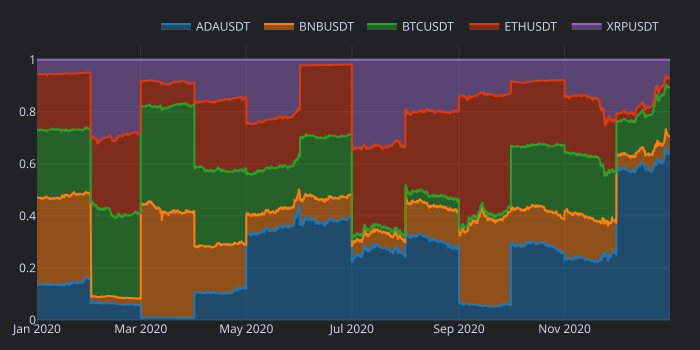

In [29]:
sim_alloc.vbt.plot(
   trace_kwargs=dict(stackgroup="one"),
   use_gl=False
).show_svg()

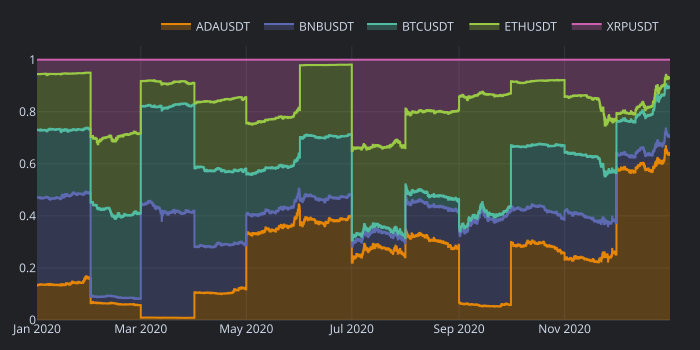

In [30]:
pf.plot_allocations().show_svg()

In [31]:
np.isclose(allocations, sim_alloc.iloc[ms_points])

array([[ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True]])

### Allocation method

In [32]:
np.random.seed(42)

pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    random_allocate_func,
    every="M"
)

In [33]:
print(pfo.allocations)

symbol                      ADAUSDT   BNBUSDT   BTCUSDT   ETHUSDT   XRPUSDT
Open time                                                                  
2020-01-01 00:00:00+00:00  0.133197  0.338101  0.260318  0.212900  0.055485
2020-02-01 00:00:00+00:00  0.065285  0.024308  0.362501  0.251571  0.296334
2020-03-01 00:00:00+00:00  0.009284  0.437468  0.375464  0.095773  0.082010
2020-04-01 00:00:00+00:00  0.105673  0.175297  0.302353  0.248877  0.167800
2020-05-01 00:00:00+00:00  0.327909  0.074759  0.156568  0.196343  0.244421
2020-06-01 00:00:00+00:00  0.367257  0.093395  0.240527  0.277095  0.021727
2020-07-01 00:00:00+00:00  0.220313  0.061837  0.023590  0.344094  0.350166
2020-08-01 00:00:00+00:00  0.346199  0.130452  0.041828  0.293025  0.188497
2020-09-01 00:00:00+00:00  0.067065  0.272119  0.018898  0.499708  0.142210
2020-10-01 00:00:00+00:00  0.297647  0.140040  0.233647  0.245617  0.083048
2020-11-01 00:00:00+00:00  0.232128  0.185574  0.224925  0.214230  0.143143
2020-12-01 0

In [34]:
print(pfo.filled_allocations)

symbol                      ADAUSDT   BNBUSDT   BTCUSDT  ETHUSDT   XRPUSDT
Open time                                                                 
2020-01-01 00:00:00+00:00  0.133197  0.338101  0.260318   0.2129  0.055485
2020-01-01 01:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-01-01 02:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-01-01 03:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-01-01 04:00:00+00:00       NaN       NaN       NaN      NaN       NaN
...                             ...       ...       ...      ...       ...
2020-12-31 19:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-12-31 20:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-12-31 21:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-12-31 22:00:00+00:00       NaN       NaN       NaN      NaN       NaN
2020-12-31 23:00:00+00:00       NaN       NaN       NaN      NaN       NaN

[8766 rows x 5 columns]


In [35]:
print(pfo.alloc_records.records_readable)

    Id  Group          Allocation Index
0    0  group 2020-01-01 00:00:00+00:00
1    1  group 2020-02-01 00:00:00+00:00
2    2  group 2020-03-01 00:00:00+00:00
3    3  group 2020-04-01 00:00:00+00:00
4    4  group 2020-05-01 00:00:00+00:00
5    5  group 2020-06-01 00:00:00+00:00
6    6  group 2020-07-01 00:00:00+00:00
7    7  group 2020-08-01 00:00:00+00:00
8    8  group 2020-09-01 00:00:00+00:00
9    9  group 2020-10-01 00:00:00+00:00
10  10  group 2020-11-01 00:00:00+00:00
11  11  group 2020-12-01 00:00:00+00:00


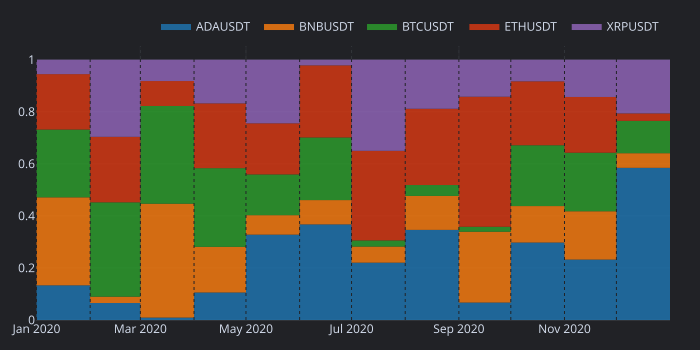

In [36]:
pfo.plot().show_svg()

In [37]:
pfo.stats()

Start Index                 2020-01-01 00:00:00+00:00
End Index                   2020-12-31 23:00:00+00:00
Total Duration                      365 days 06:00:00
Total Records                                      12
Mean Allocation: ADAUSDT                     0.229714
Mean Allocation: BNBUSDT                     0.165789
Mean Allocation: BTCUSDT                     0.197075
Mean Allocation: ETHUSDT                     0.242326
Mean Allocation: XRPUSDT                     0.165096
Name: group, dtype: object

In [38]:
pf = vbt.Portfolio.from_optimizer(data, pfo, freq="1h")

pf.sharpe_ratio

2.097991099869708

In [39]:
pf = pfo.simulate(data, freq="1h")

pf.sharpe_ratio

2.097991099869708

#### Once

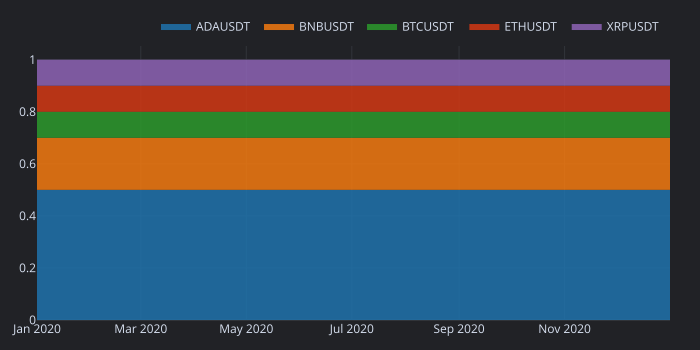

In [40]:
def const_allocate_func(target_alloc):
    return target_alloc

pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    [0.5, 0.2, 0.1, 0.1, 0.1]
)

pfo.plot().show_svg()

#### Parsing

In [41]:
custom_index = vbt.date_range("2020-01-01", "2021-01-01", freq="Q")
custom_allocations = pd.DataFrame(
    [
        [0.5, 0.2, 0.1, 0.1, 0.1],
        [0.1, 0.5, 0.2, 0.1, 0.1],
        [0.1, 0.1, 0.5, 0.2, 0.1],
        [0.1, 0.1, 0.1, 0.5, 0.2]
    ],
    index=custom_index, 
    columns=symbol_wrapper.columns
)

In [42]:
pfo = vbt.PortfolioOptimizer.from_allocations(
    symbol_wrapper,
    custom_allocations
)
print(pfo.allocations)

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      0.5      0.2      0.1      0.1      0.1
2020-04-01 00:00:00+00:00      0.1      0.5      0.2      0.1      0.1
2020-07-01 00:00:00+00:00      0.1      0.1      0.5      0.2      0.1
2020-10-01 00:00:00+00:00      0.1      0.1      0.1      0.5      0.2


In [43]:
pfo = vbt.PortfolioOptimizer.from_allocations(
    symbol_wrapper,
    custom_allocations.values,
    start="2020-01-01",
    end="2021-01-01",
    every="Q"
)
print(pfo.allocations)

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      0.5      0.2      0.1      0.1      0.1
2020-04-01 00:00:00+00:00      0.1      0.5      0.2      0.1      0.1
2020-07-01 00:00:00+00:00      0.1      0.1      0.5      0.2      0.1
2020-10-01 00:00:00+00:00      0.1      0.1      0.1      0.5      0.2


In [44]:
pfo = vbt.PortfolioOptimizer.from_filled_allocations(
    pfo.fill_allocations()
)
print(pfo.allocations)

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      0.5      0.2      0.1      0.1      0.1
2020-04-01 00:00:00+00:00      0.1      0.5      0.2      0.1      0.1
2020-07-01 00:00:00+00:00      0.1      0.1      0.5      0.2      0.1
2020-10-01 00:00:00+00:00      0.1      0.1      0.1      0.5      0.2


#### Templates

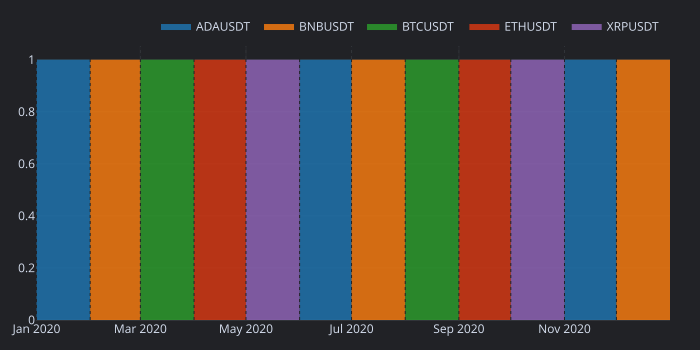

In [45]:
def rotation_allocate_func(wrapper, i):
    weights = np.full(len(wrapper.columns), 0)
    weights[i % len(wrapper.columns)] = 1
    return weights

pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func,
    vbt.Rep("wrapper"),
    vbt.Rep("i"),
    every="M"
)

pfo.plot().show_svg()

In [46]:
def rotation_allocate_func(symbols, chosen_symbol):
    return {s: 1 if s == chosen_symbol else 0 for s in symbols}

pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func,
    vbt.RepEval("wrapper.columns"),
    vbt.RepEval("wrapper.columns[i % len(wrapper.columns)]"),
    every="M"
)

In [47]:
print(pfo.allocations)

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00        1        0        0        0        0
2020-02-01 00:00:00+00:00        0        1        0        0        0
2020-03-01 00:00:00+00:00        0        0        1        0        0
2020-04-01 00:00:00+00:00        0        0        0        1        0
2020-05-01 00:00:00+00:00        0        0        0        0        1
2020-06-01 00:00:00+00:00        1        0        0        0        0
2020-07-01 00:00:00+00:00        0        1        0        0        0
2020-08-01 00:00:00+00:00        0        0        1        0        0
2020-09-01 00:00:00+00:00        0        0        0        1        0
2020-10-01 00:00:00+00:00        0        0        0        0        1
2020-11-01 00:00:00+00:00        1        0        0        0        0
2020-12-01 00:00:00+00:00        0        1        0        0        0


#### Groups

In [48]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    [0.5, 0.2, 0.1, 0.1, 0.1],
    every=vbt.Param(["1M", "2M", "3M"])
)

pf = pfo.simulate(data, freq="1h")
pf.total_return

every
1M    3.716574
2M    3.435540
3M    3.516401
Name: total_return, dtype: float64

In [49]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    vbt.Param([
        [0.5, 0.2, 0.1, 0.1, 0.1],
        [0.2, 0.1, 0.1, 0.1, 0.5]
    ], keys=pd.Index(["w1", "w2"], name="weights")),
    every=vbt.Param(["1M", "2M", "3M"])
)

In [50]:
pfo.wrapper.grouper.get_index()

MultiIndex([('1M', 'w1'),
            ('1M', 'w2'),
            ('2M', 'w1'),
            ('2M', 'w2'),
            ('3M', 'w1'),
            ('3M', 'w2')],
           names=['every', 'weights'])

In [51]:
pfo.wrapper.columns

MultiIndex([('1M', 'w1', 'ADAUSDT'),
            ('1M', 'w1', 'BNBUSDT'),
            ('1M', 'w1', 'BTCUSDT'),
            ('1M', 'w1', 'ETHUSDT'),
            ('1M', 'w1', 'XRPUSDT'),
            ('1M', 'w2', 'ADAUSDT'),
            ('1M', 'w2', 'BNBUSDT'),
            ('1M', 'w2', 'BTCUSDT'),
            ('1M', 'w2', 'ETHUSDT'),
            ('1M', 'w2', 'XRPUSDT'),
            ('2M', 'w1', 'ADAUSDT'),
            ('2M', 'w1', 'BNBUSDT'),
            ('2M', 'w1', 'BTCUSDT'),
            ('2M', 'w1', 'ETHUSDT'),
            ('2M', 'w1', 'XRPUSDT'),
            ('2M', 'w2', 'ADAUSDT'),
            ('2M', 'w2', 'BNBUSDT'),
            ('2M', 'w2', 'BTCUSDT'),
            ('2M', 'w2', 'ETHUSDT'),
            ('2M', 'w2', 'XRPUSDT'),
            ('3M', 'w1', 'ADAUSDT'),
            ('3M', 'w1', 'BNBUSDT'),
            ('3M', 'w1', 'BTCUSDT'),
            ('3M', 'w1', 'ETHUSDT'),
            ('3M', 'w1', 'XRPUSDT'),
            ('3M', 'w2', 'ADAUSDT'),
            ('3M', 'w2', 'BNBUSDT'),
 

In [52]:
pfo[("3M", "w2")].stats()

Start Index                 2020-01-01 00:00:00+00:00
End Index                   2020-12-31 23:00:00+00:00
Total Duration                      365 days 06:00:00
Total Records                                       4
Mean Allocation: ADAUSDT                          0.2
Mean Allocation: BNBUSDT                          0.1
Mean Allocation: BTCUSDT                          0.1
Mean Allocation: ETHUSDT                          0.1
Mean Allocation: XRPUSDT                          0.5
Name: (3M, w2), dtype: object

In [53]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    group_configs=[
        dict(args=([0.5, 0.2, 0.1, 0.1, 0.1],), every="1M"),
        dict(args=([0.2, 0.1, 0.1, 0.1, 0.5],), every="2M"),
        dict(args=([0.1, 0.1, 0.1, 0.5, 0.2],), every="3M"),
        dict(args=([0.1, 0.1, 0.5, 0.2, 0.1],), every="1M"),
        dict(args=([0.1, 0.5, 0.2, 0.1, 0.1],), every="2M"),
        dict(args=([0.5, 0.2, 0.1, 0.1, 0.1],), every="3M"),
    ]
)
pfo.wrapper.grouper.get_index()

Index([0, 1, 2, 3, 4, 5], dtype='int64', name='group_config')

In [54]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    group_configs=[
        dict(
            allocate_func=const_allocate_func, 
            args=([0.5, 0.2, 0.1, 0.1, 0.1],),
            _name="const"
        ),
        dict(
            allocate_func=random_allocate_func,
            every="M",
            _name="random"
        ),
    ]
)
pfo.wrapper.grouper.get_index()

  0%|          | 0/2 [00:02<?, ?it/s, group_config=const]

Index(['const', 'random'], dtype='object', name='group_config')

In [55]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    const_allocate_func,
    group_configs={
        "const": dict(
            allocate_func=const_allocate_func, 
            args=([0.5, 0.2, 0.1, 0.1, 0.1],)
        ),
        "random": dict(
            allocate_func=random_allocate_func,
        ),
    },
    every=vbt.Param(["1M", "2M", "3M"])
)
pfo.wrapper.grouper.get_index()

MultiIndex([('1M',  'const'),
            ('1M', 'random'),
            ('2M',  'const'),
            ('2M', 'random'),
            ('3M',  'const'),
            ('3M', 'random')],
           names=['every', 'group_config'])

#### Numba

In [56]:
@njit
def rotation_allocate_func_nb(i, idx, n_cols):
    weights = np.full(n_cols, 0)
    weights[i % n_cols] = 1
    return weights

pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func_nb,
    vbt.RepEval("len(wrapper.columns)"),
    every="W",
    jitted_loop=True
)

print(pfo.allocations.head())

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-06 00:00:00+00:00      1.0      0.0      0.0      0.0      0.0
2020-01-13 00:00:00+00:00      0.0      1.0      0.0      0.0      0.0
2020-01-20 00:00:00+00:00      0.0      0.0      1.0      0.0      0.0
2020-01-27 00:00:00+00:00      0.0      0.0      0.0      1.0      0.0
2020-02-03 00:00:00+00:00      0.0      0.0      0.0      0.0      1.0


#### Distribution

In [57]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func_nb,
    vbt.Rep("i"),
    vbt.Rep("index_point"),
    vbt.RepEval("len(wrapper.columns)"),
    every="D",
    execute_kwargs=dict(engine="dask")
)

print(pfo.allocations.head())

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00        1        0        0        0        0
2020-01-02 00:00:00+00:00        0        1        0        0        0
2020-01-03 00:00:00+00:00        0        0        1        0        0
2020-01-04 00:00:00+00:00        0        0        0        1        0
2020-01-05 00:00:00+00:00        0        0        0        0        1


In [58]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func_nb,
    vbt.RepEval("len(wrapper.columns)"),
    every="D",
    jitted_loop=True,
    chunked=dict(
        arg_take_spec=dict(args=vbt.ArgsTaker(None)),
        engine="dask"
    )
)

print(pfo.allocations.head())

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      1.0      0.0      0.0      0.0      0.0
2020-01-02 00:00:00+00:00      0.0      1.0      0.0      0.0      0.0
2020-01-03 00:00:00+00:00      0.0      0.0      1.0      0.0      0.0
2020-01-04 00:00:00+00:00      0.0      0.0      0.0      1.0      0.0
2020-01-05 00:00:00+00:00      0.0      0.0      0.0      0.0      1.0


In [59]:
pfo = vbt.PortfolioOptimizer.from_allocate_func(
    symbol_wrapper,
    rotation_allocate_func_nb,
    vbt.RepEval("len(wrapper.columns)"),
    every="D",
    jitted_loop=True,
    jitted=dict(parallel=True)
)

print(pfo.allocations.head())

symbol                     ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
Open time                                                             
2020-01-01 00:00:00+00:00      1.0      0.0      0.0      0.0      0.0
2020-01-02 00:00:00+00:00      0.0      1.0      0.0      0.0      0.0
2020-01-03 00:00:00+00:00      0.0      0.0      1.0      0.0      0.0
2020-01-04 00:00:00+00:00      0.0      0.0      0.0      1.0      0.0
2020-01-05 00:00:00+00:00      0.0      0.0      0.0      0.0      1.0


## Optimization

### Index ranges

In [60]:
example_ranges = data.wrapper.get_index_ranges(every="M")
example_ranges[0]

array([   0,  744, 1434, 2177, 2895, 3639, 4356, 5100, 5844, 6564, 7308])

In [61]:
example_ranges[1]

array([ 744, 1434, 2177, 2895, 3639, 4356, 5100, 5844, 6564, 7308, 8027])

In [62]:
data.wrapper.index[example_ranges[0][0]:example_ranges[1][0]]

DatetimeIndex(['2020-01-01 00:00:00+00:00', '2020-01-01 01:00:00+00:00',
               '2020-01-01 02:00:00+00:00', '2020-01-01 03:00:00+00:00',
               '2020-01-01 04:00:00+00:00', '2020-01-01 05:00:00+00:00',
               '2020-01-01 06:00:00+00:00', '2020-01-01 07:00:00+00:00',
               '2020-01-01 08:00:00+00:00', '2020-01-01 09:00:00+00:00',
               ...
               '2020-01-31 14:00:00+00:00', '2020-01-31 15:00:00+00:00',
               '2020-01-31 16:00:00+00:00', '2020-01-31 17:00:00+00:00',
               '2020-01-31 18:00:00+00:00', '2020-01-31 19:00:00+00:00',
               '2020-01-31 20:00:00+00:00', '2020-01-31 21:00:00+00:00',
               '2020-01-31 22:00:00+00:00', '2020-01-31 23:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Open time', length=744, freq=None)

In [63]:
example_ranges = data.wrapper.get_index_ranges(
    every="M", 
    lookback_period="3M"
)

def get_index_bounds(range_starts, range_ends):
    for i in range(len(range_starts)):
        range_index = data.wrapper.index[range_starts[i]:range_ends[i]]
        yield range_index[0], range_index[-1]

list(get_index_bounds(*example_ranges))

[(Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-03-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-02-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-04-30 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-03-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-05-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-04-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-06-30 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-05-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-07-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-06-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-08-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-07-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-09-30 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-08-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-10-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-09-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-11-30 23:00:00+0000', tz='UTC'))]

In [64]:
example_ranges = data.wrapper.get_index_ranges(
    start=["2020-01-01", "2020-04-01", "2020-08-01"],
    end=["2020-04-01", "2020-08-01", "2020-12-01"]
)

list(get_index_bounds(*example_ranges))

[(Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-03-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-04-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-07-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-08-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-11-30 23:00:00+0000', tz='UTC'))]

In [65]:
example_ranges = data.wrapper.get_index_ranges(
    start="2020-01-01",
    end=["2020-04-01", "2020-08-01", "2020-12-01"]
)

list(get_index_bounds(*example_ranges))

[(Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-03-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-07-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-11-30 23:00:00+0000', tz='UTC'))]

In [66]:
example_ranges = data.wrapper.get_index_ranges(
    every="Q",
    exact_start=True,
    fixed_start=True
)

list(get_index_bounds(*example_ranges))

[(Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-03-31 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-06-30 23:00:00+0000', tz='UTC')),
 (Timestamp('2020-01-01 00:00:00+0000', tz='UTC'),
  Timestamp('2020-09-30 23:00:00+0000', tz='UTC'))]

### Optimization method

In [67]:
def inv_rank_optimize_func(price, index_slice):
    price_period = price.iloc[index_slice]
    first_price = price_period.iloc[0]
    last_price = price_period.iloc[-1]
    ret = (last_price - first_price) / first_price
    ranks = ret.rank(ascending=False)
    return ranks / ranks.sum()

pfo = vbt.PortfolioOptimizer.from_optimize_func(
    symbol_wrapper,
    inv_rank_optimize_func,
    data.get("Close"),
    vbt.Rep("index_slice"),
    every="M"
)

print(pfo.allocations)

symbol                      ADAUSDT   BNBUSDT   BTCUSDT   ETHUSDT   XRPUSDT
Open time                                                                  
2020-02-01 00:00:00+00:00  0.066667  0.200000  0.266667  0.133333  0.333333
2020-03-01 00:00:00+00:00  0.333333  0.133333  0.266667  0.066667  0.200000
2020-04-01 00:00:00+00:00  0.266667  0.200000  0.133333  0.333333  0.066667
2020-05-01 00:00:00+00:00  0.066667  0.200000  0.266667  0.133333  0.333333
2020-06-01 00:00:00+00:00  0.066667  0.266667  0.200000  0.133333  0.333333
2020-07-01 00:00:00+00:00  0.066667  0.266667  0.200000  0.133333  0.333333
2020-08-01 00:00:00+00:00  0.066667  0.266667  0.333333  0.133333  0.200000
2020-09-01 00:00:00+00:00  0.333333  0.133333  0.266667  0.066667  0.200000
2020-10-01 00:00:00+00:00  0.266667  0.066667  0.133333  0.333333  0.200000
2020-11-01 00:00:00+00:00  0.333333  0.266667  0.066667  0.133333  0.200000
2020-12-01 00:00:00+00:00  0.133333  0.333333  0.266667  0.200000  0.066667


In [68]:
print(pfo.alloc_records.records_readable)

    Range Id  Group               Start Index                 End Index  \
0          0  group 2020-01-01 00:00:00+00:00 2020-02-01 00:00:00+00:00   
1          1  group 2020-02-01 00:00:00+00:00 2020-03-01 00:00:00+00:00   
2          2  group 2020-03-01 00:00:00+00:00 2020-04-01 00:00:00+00:00   
3          3  group 2020-04-01 00:00:00+00:00 2020-05-01 00:00:00+00:00   
4          4  group 2020-05-01 00:00:00+00:00 2020-06-01 00:00:00+00:00   
5          5  group 2020-06-01 00:00:00+00:00 2020-07-01 00:00:00+00:00   
6          6  group 2020-07-01 00:00:00+00:00 2020-08-01 00:00:00+00:00   
7          7  group 2020-08-01 00:00:00+00:00 2020-09-01 00:00:00+00:00   
8          8  group 2020-09-01 00:00:00+00:00 2020-10-01 00:00:00+00:00   
9          9  group 2020-10-01 00:00:00+00:00 2020-11-01 00:00:00+00:00   
10        10  group 2020-11-01 00:00:00+00:00 2020-12-01 00:00:00+00:00   

            Allocation Index  Status  
0  2020-02-01 00:00:00+00:00  Closed  
1  2020-03-01 00:00:0

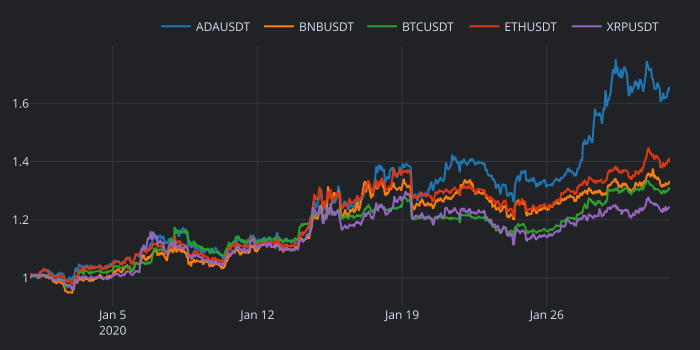

In [69]:
start_idx = pfo.alloc_records.values[0]["start_idx"]
end_idx = pfo.alloc_records.values[0]["end_idx"]
close_period = data.get("Close").iloc[start_idx:end_idx]
close_period.vbt.rebase(1).vbt.plot().show_svg()

In [70]:
pfo.stats()

Start Index                 2020-01-01 00:00:00+00:00
End Index                   2020-12-31 23:00:00+00:00
Total Duration                      365 days 06:00:00
Total Records                                      11
Coverage                                     0.915697
Overlap Coverage                                  0.0
Mean Allocation: ADAUSDT                     0.181818
Mean Allocation: BNBUSDT                     0.212121
Mean Allocation: BTCUSDT                     0.218182
Mean Allocation: ETHUSDT                     0.163636
Mean Allocation: XRPUSDT                     0.224242
Name: group, dtype: object

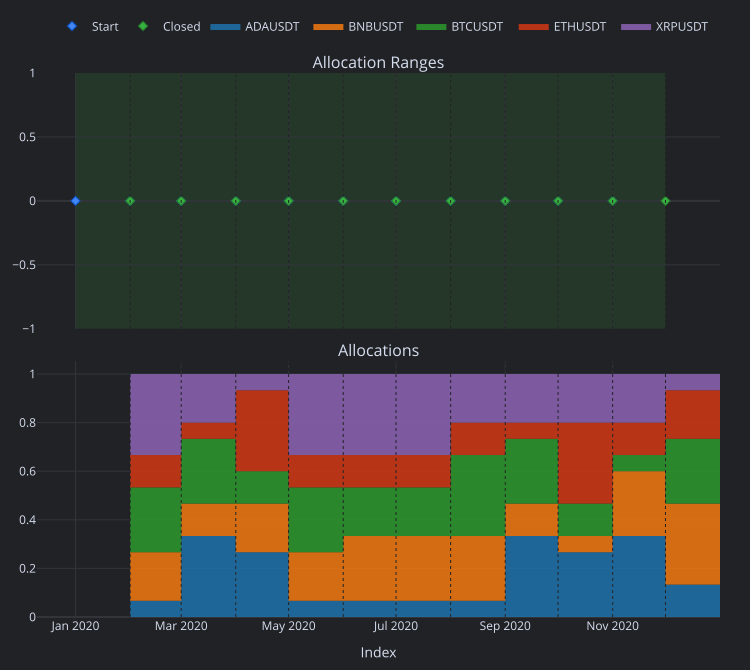

In [71]:
pfo.plots().show_svg()

#### Numba

In [72]:
@njit
def inv_rank_optimize_func_nb(i, start_idx, end_idx, price):
    price_period = price[start_idx:end_idx]
    first_price = price_period[0]
    last_price = price_period[-1]
    ret = (last_price - first_price) / first_price
    ranks = vbt.nb.rank_1d_nb(-ret)
    return ranks / ranks.sum()

pfo = vbt.PortfolioOptimizer.from_optimize_func(
    symbol_wrapper,
    inv_rank_optimize_func_nb,
    data.get("Close").values,
    every="M",
    jitted_loop=True
)

print(pfo.allocations)

symbol                      ADAUSDT   BNBUSDT   BTCUSDT   ETHUSDT   XRPUSDT
Open time                                                                  
2020-02-01 00:00:00+00:00  0.066667  0.200000  0.266667  0.133333  0.333333
2020-03-01 00:00:00+00:00  0.333333  0.133333  0.266667  0.066667  0.200000
2020-04-01 00:00:00+00:00  0.266667  0.200000  0.133333  0.333333  0.066667
2020-05-01 00:00:00+00:00  0.066667  0.200000  0.266667  0.133333  0.333333
2020-06-01 00:00:00+00:00  0.066667  0.266667  0.200000  0.133333  0.333333
2020-07-01 00:00:00+00:00  0.066667  0.266667  0.200000  0.133333  0.333333
2020-08-01 00:00:00+00:00  0.066667  0.266667  0.333333  0.133333  0.200000
2020-09-01 00:00:00+00:00  0.333333  0.133333  0.266667  0.066667  0.200000
2020-10-01 00:00:00+00:00  0.266667  0.066667  0.133333  0.333333  0.200000
2020-11-01 00:00:00+00:00  0.333333  0.266667  0.066667  0.133333  0.200000
2020-12-01 00:00:00+00:00  0.133333  0.333333  0.266667  0.200000  0.066667


## Integrations

### PyPortfolioOpt

In [73]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
from pypfopt.efficient_frontier import EfficientFrontier

expected_returns = mean_historical_return(data.get("Close"))
cov_matrix = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
optimizer = EfficientFrontier(expected_returns, cov_matrix)
weights = optimizer.max_sharpe()
weights

OrderedDict([('ADAUSDT', 0.1166001117223093),
             ('BNBUSDT', 0.0),
             ('BTCUSDT', 0.0),
             ('ETHUSDT', 0.8833998882776908),
             ('XRPUSDT', 0.0)])

#### Parsing

In [74]:
from vectorbtpro.portfolio.pfopt.base import resolve_pypfopt_func_kwargs

print(vbt.format_func(mean_historical_return))

print(vbt.prettify(resolve_pypfopt_func_kwargs(
    mean_historical_return, 
    prices=data.get("Close"),
    freq="1h",
    year_freq="365d",
    other_arg=100
)))

mean_historical_return(
    prices,
    returns_data=False,
    compounding=True,
    frequency=252,
    log_returns=False
):
    Calculate annualised mean (daily) historical return from input (daily) asset prices.
    Use ``compounding`` to toggle between the default geometric mean (CAGR) and the
    arithmetic mean.
    
    :param prices: adjusted closing prices of the asset, each row is a date
                   and each column is a ticker/id.
    :type prices: pd.DataFrame
    :param returns_data: if true, the first argument is returns instead of prices.
                         These **should not** be log returns.
    :type returns_data: bool, defaults to False.
    :param compounding: computes geometric mean returns if True,
                        arithmetic otherwise, optional.
    :type compounding: bool, defaults to True
    :param frequency: number of time periods in a year, defaults to 252 (the number
                      of trading days in a year)
    :type frequency: in

In [75]:
print(vbt.prettify(resolve_pypfopt_func_kwargs(
    EfficientFrontier, 
    prices=data.get("Close")
)))

dict(
    expected_returns=<pandas.core.series.Series object at 0x7fd72ede0850 with shape (5,)>,
    cov_matrix=<pandas.core.frame.DataFrame object at 0x7fd72ede0130 with shape (5, 5)>,
    weight_bounds=(
        0,
        1
    ),
    solver=None,
    verbose=False,
    solver_options=None
)


In [76]:
print(vbt.prettify(resolve_pypfopt_func_kwargs(
    EfficientFrontier, 
    prices=data.get("Close"),
    expected_returns="ema_historical_return",
    cov_matrix="sample_cov"
)))

dict(
    expected_returns=<pandas.core.series.Series object at 0x7fd72f1b0c40 with shape (5,)>,
    cov_matrix=<pandas.core.frame.DataFrame object at 0x7fd736f347c0 with shape (5, 5)>,
    weight_bounds=(
        0,
        1
    ),
    solver=None,
    verbose=False,
    solver_options=None
)


#### Auto-optimization

In [77]:
vbt.pypfopt_optimize(prices=data.get("Close"))

{'ADAUSDT': 0.1166,
 'BNBUSDT': 0.0,
 'BTCUSDT': 0.0,
 'ETHUSDT': 0.8834,
 'XRPUSDT': 0.0}

In [78]:
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(None, S, weight_bounds=(-1, 1))
ef.min_volatility()
weights = ef.clean_weights()
weights

OrderedDict([('ADAUSDT', -0.01118),
             ('BNBUSDT', 0.09695),
             ('BTCUSDT', 0.9624),
             ('ETHUSDT', -0.10516),
             ('XRPUSDT', 0.05699)])

In [79]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    expected_returns=None,
    weight_bounds=(-1, 1),
    target="min_volatility"
)

{'ADAUSDT': -0.01118,
 'BNBUSDT': 0.09695,
 'BTCUSDT': 0.9624,
 'ETHUSDT': -0.10516,
 'XRPUSDT': 0.05699}

In [80]:
from pypfopt.expected_returns import capm_return

sector_mapper = {
    "ADAUSDT": "DeFi",
    "BNBUSDT": "DeFi",
    "BTCUSDT": "Payment",
    "ETHUSDT": "DeFi",
    "XRPUSDT": "Payment"
}
sector_lower = {
    "DeFi": 0.75
}
sector_upper = {}

mu = capm_return(data.get("Close"))
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(mu, S)
ef.add_sector_constraints(sector_mapper, sector_lower, sector_upper)
adausdt_index = ef.tickers.index("ADAUSDT")
ef.add_constraint(lambda w: w[adausdt_index] == 0.10)
ef.max_sharpe()
weights = ef.clean_weights()
weights

OrderedDict([('ADAUSDT', 0.1),
             ('BNBUSDT', 0.2772),
             ('BTCUSDT', 0.0524),
             ('ETHUSDT', 0.3728),
             ('XRPUSDT', 0.1976)])

In [81]:
adausdt_index = list(sector_mapper.keys()).index("ADAUSDT")
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    sector_mapper=sector_mapper,
    sector_lower=sector_lower,
    sector_upper=sector_upper,
    constraints=[lambda w: w[adausdt_index] == 0.10],
    expected_returns="capm_return"
)

{'ADAUSDT': 0.1,
 'BNBUSDT': 0.2772,
 'BTCUSDT': 0.0524,
 'ETHUSDT': 0.3728,
 'XRPUSDT': 0.1976}

In [82]:
from pypfopt.objective_functions import L2_reg

mu = capm_return(data.get("Close"))
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(mu, S)
ef.add_sector_constraints(sector_mapper, sector_lower, sector_upper)
ef.add_objective(L2_reg, gamma=0.1)  # gamme is the tuning parameter
ef.efficient_risk(0.15)
weights = ef.clean_weights()
weights

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/cvxpy/reductions/solvers/solving_chain.py:336: FutureWarning:


    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    



OrderedDict([('ADAUSDT', 0.26004),
             ('BNBUSDT', 0.24466),
             ('BTCUSDT', 0.10778),
             ('ETHUSDT', 0.2453),
             ('XRPUSDT', 0.14222)])

In [83]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    expected_returns="capm_return",
    sector_mapper=sector_mapper,
    sector_lower=sector_lower,
    sector_upper=sector_upper,
    objectives=["L2_reg"],
    gamma=0.1,
    target="efficient_risk",
    target_volatility=0.15
)

{'ADAUSDT': 0.26004,
 'BNBUSDT': 0.24466,
 'BTCUSDT': 0.10778,
 'ETHUSDT': 0.2453,
 'XRPUSDT': 0.14222}

In [84]:
from pypfopt import EfficientSemivariance
from pypfopt.expected_returns import returns_from_prices

mu = capm_return(data.get("Close"))
returns = returns_from_prices(data.get("Close"))
returns = returns.dropna()
es = EfficientSemivariance(mu, returns)
es.efficient_return(0.01)
weights = es.clean_weights()
weights

OrderedDict([('ADAUSDT', 0.0),
             ('BNBUSDT', 0.0),
             ('BTCUSDT', 1.0),
             ('ETHUSDT', 0.0),
             ('XRPUSDT', 0.0)])

In [85]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    expected_returns="capm_return",
    optimizer="efficient_semivariance",
    target="efficient_return",
    target_return=0.01
)

{'ADAUSDT': 0.0, 'BNBUSDT': 0.0, 'BTCUSDT': 1, 'ETHUSDT': 0.0, 'XRPUSDT': 0.0}

In [86]:
initial_weights = np.array([1 / len(data.symbols)] * len(data.symbols))

In [87]:
from pypfopt.objective_functions import transaction_cost

mu = mean_historical_return(data.get("Close"))
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(mu, S)
ef.add_objective(transaction_cost, w_prev=initial_weights, k=0.001)
ef.add_objective(L2_reg, gamma=0.05)
ef.min_volatility()
weights = ef.clean_weights()
weights

OrderedDict([('ADAUSDT', 0.16025),
             ('BNBUSDT', 0.2),
             ('BTCUSDT', 0.27241),
             ('ETHUSDT', 0.2),
             ('XRPUSDT', 0.16734)])

In [88]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    objectives=["transaction_cost", "L2_reg"],
    w_prev=initial_weights, 
    k=0.001,
    gamma=0.05,
    target="min_volatility"
)

{'ADAUSDT': 0.16025,
 'BNBUSDT': 0.2,
 'BTCUSDT': 0.27241,
 'ETHUSDT': 0.2,
 'XRPUSDT': 0.16734}

In [89]:
import cvxpy as cp

def logarithmic_barrier_objective(w, cov_matrix, k=0.1):
    log_sum = cp.sum(cp.log(w))
    var = cp.quad_form(w, cov_matrix)
    return var - k * log_sum

In [90]:
mu = mean_historical_return(data.get("Close"))
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(mu, S, weight_bounds=(0.01, 0.3))
ef.convex_objective(logarithmic_barrier_objective, cov_matrix=S, k=0.001)
weights = ef.clean_weights()
weights

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/cvxpy/reductions/solvers/solving_chain.py:336: FutureWarning:


    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    



OrderedDict([('ADAUSDT', 0.12214),
             ('BNBUSDT', 0.22175),
             ('BTCUSDT', 0.3),
             ('ETHUSDT', 0.21855),
             ('XRPUSDT', 0.13756)])

In [91]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    weight_bounds=(0.01, 0.3),
    k=0.001,
    target=logarithmic_barrier_objective
)

{'ADAUSDT': 0.12214,
 'BNBUSDT': 0.22175,
 'BTCUSDT': 0.3,
 'ETHUSDT': 0.21855,
 'XRPUSDT': 0.13756}

In [92]:
def deviation_risk_parity(w, cov_matrix):
    cov_matrix = np.asarray(cov_matrix)
    n = cov_matrix.shape[0]
    rp = (w * (cov_matrix @ w)) / cp.quad_form(w, cov_matrix)
    return cp.sum_squares(rp - 1 / n).value

In [93]:
mu = mean_historical_return(data.get("Close"))
S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
ef = EfficientFrontier(mu, S)
ef.nonconvex_objective(deviation_risk_parity, ef.cov_matrix)
weights = ef.clean_weights()
weights

OrderedDict([('ADAUSDT', 0.17421),
             ('BNBUSDT', 0.19933),
             ('BTCUSDT', 0.2515),
             ('ETHUSDT', 0.1981),
             ('XRPUSDT', 0.17686)])

In [94]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    target=deviation_risk_parity,
    target_is_convex=False
)

{'ADAUSDT': 0.17421,
 'BNBUSDT': 0.19933,
 'BTCUSDT': 0.2515,
 'ETHUSDT': 0.1981,
 'XRPUSDT': 0.17686}

In [95]:
sp500_data = vbt.YFData.pull(
    "^GSPC", 
    start=data.wrapper.index[0], 
    end=data.wrapper.index[-1]
)
market_caps = data.get("Close") * data.get("Volume")
viewdict = {
    "ADAUSDT": 0.20, 
    "BNBUSDT": -0.30, 
    "BTCUSDT": 0, 
    "ETHUSDT": -0.2, 
    "XRPUSDT": 0.15
}

In [96]:
from pypfopt.black_litterman import (
    market_implied_risk_aversion,
    market_implied_prior_returns,
    BlackLittermanModel
)

S = CovarianceShrinkage(data.get("Close")).ledoit_wolf()
delta = market_implied_risk_aversion(sp500_data.get("Close"))
prior = market_implied_prior_returns(market_caps.iloc[-1], delta, S)
bl = BlackLittermanModel(S, pi=prior, absolute_views=viewdict)
rets = bl.bl_returns()
ef = EfficientFrontier(rets, S)
ef.min_volatility()
weights = ef.clean_weights()
weights

OrderedDict([('ADAUSDT', 0.0),
             ('BNBUSDT', 0.06743),
             ('BTCUSDT', 0.89462),
             ('ETHUSDT', 0.0),
             ('XRPUSDT', 0.03795)])

In [97]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    expected_returns="bl_returns",
    market_prices=sp500_data.get("Close"),
    market_caps=market_caps.iloc[-1],
    absolute_views=viewdict,
    target="min_volatility"
)

{'ADAUSDT': 0.0,
 'BNBUSDT': 0.06743,
 'BTCUSDT': 0.89462,
 'ETHUSDT': 0.0,
 'XRPUSDT': 0.03795}

In [98]:
from pypfopt import HRPOpt

rets = returns_from_prices(data.get("Close"))
hrp = HRPOpt(rets)
hrp.optimize()
weights = hrp.clean_weights()
weights

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/pypfopt/hierarchical_portfolio.py:138: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.37122723 0.37122723]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



OrderedDict([('ADAUSDT', 0.19415),
             ('BNBUSDT', 0.24834),
             ('BTCUSDT', 0.22827),
             ('ETHUSDT', 0.15217),
             ('XRPUSDT', 0.17707)])

In [99]:
vbt.pypfopt_optimize(
    prices=data.get("Close"),
    optimizer="hrp",
    target="optimize"
)

{'ADAUSDT': 0.19415,
 'BNBUSDT': 0.24834,
 'BTCUSDT': 0.22827,
 'ETHUSDT': 0.15217,
 'XRPUSDT': 0.17707}

#### Argument groups

In [100]:
vbt.pypfopt_optimize(  
    prices=data.get("Close"),
    expected_returns="bl_returns",  
    market_prices=sp500_data.get("Close"),
    market_caps=market_caps.iloc[-1],
    absolute_views=viewdict,
    target="min_volatility",
    cov_matrix=vbt.pfopt_func_dict({
        "EfficientFrontier": "sample_cov",
        "_def": "ledoit_wolf"
    })
)

{'ADAUSDT': 0.0,
 'BNBUSDT': 0.05013,
 'BTCUSDT': 0.91912,
 'ETHUSDT': 0.0,
 'XRPUSDT': 0.03075}

#### Periodically

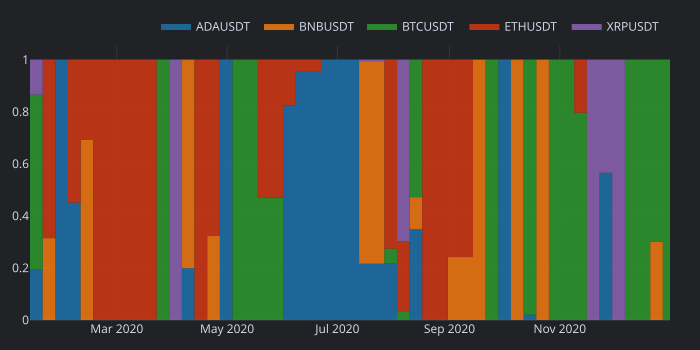

In [101]:
pfo = vbt.PortfolioOptimizer.from_pypfopt(
    prices=data.get("Close"),
    every="W"
)

pfo.plot().show_svg()

 33%|###3      | 1/3 [00:02<00:04,  2.01s/it, target=min_volatility]

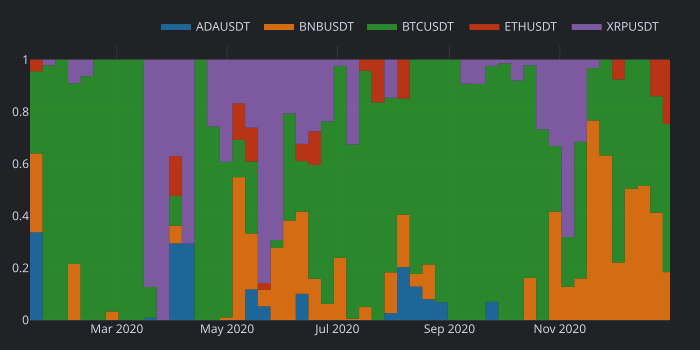

In [102]:
pfo = vbt.PortfolioOptimizer.from_pypfopt(
    prices=data.get("Close"),
    every="W",
    target=vbt.Param([
        "max_sharpe", 
        "min_volatility", 
        "max_quadratic_utility"
    ])
)

pfo.plot(column="min_volatility").show_svg()

In [103]:
pf = pfo.simulate(data, freq="1h")

pf.sharpe_ratio

target
max_sharpe               2.463088
min_volatility           1.785154
max_quadratic_utility    2.677955
Name: sharpe_ratio, dtype: float64

### Riskfolio-Lib

#### Parsing

In [104]:
import riskfolio as rp

returns = data.get("Close").vbt.to_returns()

port = rp.Portfolio(returns=returns)
port.assets_stats(
    method_mu="hist", 
    method_cov="hist",
    d=0.94
)
w = port.optimization(
    model="Classic",
    rm="MV",
    obj="Sharpe",
    rf=0,
    l=0,
    hist=True
)
print(w.T)

          ADAUSDT       BNBUSDT   BTCUSDT   ETHUSDT       XRPUSDT
weights  0.207779  1.043610e-08  0.336897  0.455323  3.650428e-09


In [105]:
from vectorbtpro.utils.parsing import get_func_arg_names

get_func_arg_names(port.assets_stats)

['method_mu', 'method_cov', 'method_kurt', 'd']

In [106]:
from vectorbtpro.portfolio.pfopt.base import resolve_riskfolio_func_kwargs

resolve_riskfolio_func_kwargs(
    port.assets_stats,
    method_mu="hist",
    method_cov="hist",
    model="Classic"
)

{'method_mu': 'hist', 'method_cov': 'hist'}

In [107]:
resolve_riskfolio_func_kwargs(
    port.assets_stats,
    method_mu="hist",
    method_cov="hist",
    model="Classic",
    func_kwargs=dict(
        assets_stats=dict(method_mu="ewma1"),
        optimization=dict(model="BL")
    )
)

{'method_mu': 'ewma1', 'method_cov': 'hist'}

#### Auto-optimization

In [108]:
vbt.riskfolio_optimize(returns)

{'ADAUSDT': 0.20777948638409993,
 'BNBUSDT': 1.0795383777626197e-08,
 'BTCUSDT': 0.33689721343673557,
 'ETHUSDT': 0.4553232856074664,
 'XRPUSDT': 3.776314512800271e-09}

In [109]:
port = rp.Portfolio(returns=returns)
port.assets_stats(
    method_mu="hist", 
    method_cov="hist", 
    d=0.94
)
w = port.optimization(
    model="Classic", 
    rm="UCI", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)
print(w.T)

              ADAUSDT       BNBUSDT   BTCUSDT   ETHUSDT       XRPUSDT
weights  1.095178e-09  5.560932e-10  0.834301  0.165699  2.100858e-09


In [110]:
vbt.riskfolio_optimize(
    returns,
    method_mu="hist", 
    method_cov="hist", 
    d=0.94,
    rm="UCI", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)

{'ADAUSDT': 1.1397639412968612e-09,
 'BNBUSDT': 6.399678204637742e-10,
 'BTCUSDT': 0.8343014233959932,
 'ETHUSDT': 0.1656985724138855,
 'XRPUSDT': 2.410389326134059e-09}

In [111]:
port = rp.Portfolio(returns=returns)
port.assets_stats(
    method_mu="hist", 
    method_cov="hist", 
    d=0.94
)
port.wc_stats(
    box="s", 
    ellip="s", 
    q=0.05, 
    n_sim=3000, 
    window=3, 
    dmu=0.1, 
    dcov=0.1, 
    seed=0
)
w = port.wc_optimization(
    obj="Sharpe", 
    rf=0, 
    l=0, 
    Umu="box", 
    Ucov="box"
)
print(w.T)

              ADAUSDT       BNBUSDT   BTCUSDT   ETHUSDT       XRPUSDT
weights  9.364765e-08  1.440866e-08  0.465158  0.534842  4.687950e-09


In [112]:
vbt.riskfolio_optimize(
    returns,
    opt_method="wc",
    method_mu="hist", 
    method_cov="hist", 
    box="s", 
    ellip="s", 
    q=0.05, 
    n_sim=3000, 
    window=3, 
    dmu=0.1, 
    dcov=0.1, 
    seed=0,
    obj="Sharpe", 
    rf=0, 
    l=0, 
    Umu="box", 
    Ucov="box"
)

{'ADAUSDT': 2.362572815918503e-08,
 'BNBUSDT': 3.5954498897355133e-09,
 'BTCUSDT': 0.33562493504269214,
 'ETHUSDT': 0.664375036610512,
 'XRPUSDT': 1.125617914562214e-09}

In [113]:
vbt.riskfolio_optimize(
    returns,
    func_kwargs=dict(
        assets_stats=dict(
            opt_method="wc",
            method_mu="hist", 
            method_cov="hist"
        ),
        wc_stats=dict(
            box="s", 
            ellip="s", 
            q=0.05, 
            n_sim=3000, 
            window=3, 
            dmu=0.1, 
            dcov=0.1, 
            seed=0
        ),
        wc_optimization=dict(
            obj="Sharpe", 
            rf=0, 
            l=0, 
            Umu="box", 
            Ucov="box"
        )
    )
)

{'ADAUSDT': 2.362572815918503e-08,
 'BNBUSDT': 3.5954498897355133e-09,
 'BTCUSDT': 0.33562493504269214,
 'ETHUSDT': 0.664375036610512,
 'XRPUSDT': 1.125617914562214e-09}

In [114]:
port = rp.Portfolio(returns=returns)
port.sht = True # Allows to use Short Weights
port.uppersht = 0.3 # Maximum value of sum of short weights in absolute value
port.upperlng = 1.3 # Maximum value of sum of positive weights
port.budget = 1.0 # No leverage
port.assets_stats(
    method_mu="hist", 
    method_cov="hist", 
    d=0.94
)
w = port.optimization(
    model="Classic", 
    rm="MV", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)
print(w.T)

          ADAUSDT       BNBUSDT   BTCUSDT   ETHUSDT  XRPUSDT
weights  0.295484 -1.172146e-08  0.456183  0.548333     -0.3


In [115]:
vbt.riskfolio_optimize(
    returns,
    sht=True,
    uppersht=0.3,
    upperlng=1.3,
    budget=1.0,
    method_mu="hist", 
    method_cov="hist", 
    d=0.94,
    rm="MV", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)

{'ADAUSDT': 0.2954837384572075,
 'BNBUSDT': -1.1690741722393727e-08,
 'BTCUSDT': 0.45618287201196184,
 'ETHUSDT': 0.548333364465864,
 'XRPUSDT': -0.29999996324429173}

In [116]:
port = rp.Portfolio(returns=returns)
port.assets_stats(
    method_mu="hist", 
    method_cov="hist",
    d=0.94
)
asset_classes = {"Assets": returns.columns.tolist()}
asset_classes = pd.DataFrame(asset_classes)
constraints = {
    "Disabled": [False, False],
    "Type": ["All Assets", "Assets"],
    "Set": ["", ""],
    "Position": ["", "BTCUSDT"],
    "Sign": [">=", "<="],
    'Weight': [0.1, 0.15],
    "Type Relative": ["", ""],
    "Relative Set": ["", ""],
    "Relative": ["", ""],
    "Factor": ["", ""],
}
constraints = pd.DataFrame(constraints)
A, B = rp.assets_constraints(constraints, asset_classes)
port.ainequality = A
port.binequality = B
w = port.optimization(
    model="Classic",
    rm="MV",
    obj="Sharpe",
    rf=0,
    l=0,
    hist=True
)
print(w.T)

          ADAUSDT  BNBUSDT  BTCUSDT   ETHUSDT  XRPUSDT
weights  0.181443      0.1     0.15  0.468557      0.1


In [117]:
vbt.riskfolio_optimize(
    returns,
    method_mu="hist", 
    method_cov="hist", 
    constraints=[{
        "Type": "All Assets",
        "Sign": ">=",
        "Weight": 0.1
    }, {
        "Type": "Assets",
        "Position": "BTCUSDT",
        "Sign": "<=",
        "Weight": 0.15
    }],
    d=0.94,
    rm="MV", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)

{'ADAUSDT': 0.1814429883522832,
 'BNBUSDT': 0.10000000610746963,
 'BTCUSDT': 0.14999983503805575,
 'ETHUSDT': 0.46855716818210535,
 'XRPUSDT': 0.10000000232008614}

In [118]:
tags = [
    "Smart contracts",
    "Smart contracts",
    "Payments",
    "Smart contracts",
    "Payments"
]

In [119]:
port = rp.Portfolio(returns=returns)
port.assets_stats(
    method_mu="hist", 
    method_cov="hist",
    d=0.94
)
asset_classes = {
    "Assets": returns.columns.tolist(),
    "Tags": tags
}
asset_classes = pd.DataFrame(asset_classes)
constraints = {
    "Disabled": [False],
    "Type": ["Classes"],
    "Set": ["Tags"],
    "Position": ["Smart contracts"],
    "Sign": [">="],
    'Weight': [0.8],
    "Type Relative": [""],
    "Relative Set": [""],
    "Relative": [""],
    "Factor": [""],
}
constraints = pd.DataFrame(constraints)
A, B = rp.assets_constraints(constraints, asset_classes)
port.ainequality = A
port.binequality = B
w = port.optimization(
    model="Classic",
    rm="MV",
    obj="Sharpe",
    rf=0,
    l=0,
    hist=True
)
print(w.T)

          ADAUSDT       BNBUSDT  BTCUSDT   ETHUSDT       XRPUSDT
weights  0.227839  5.856749e-10      0.2  0.572161  1.852781e-10


In [120]:
vbt.riskfolio_optimize(
    returns,
    method_mu="hist", 
    method_cov="hist", 
    asset_classes={"Tags": tags},
    constraints=[{
        "Type": "Classes",
        "Set": "Tags",
        "Position": "Smart contracts",
        "Sign": ">=",
        "Weight": 0.8
    }],
    d=0.94,
    rm="MV", 
    obj="Sharpe", 
    rf=0, 
    l=0, 
    hist=True
)

{'ADAUSDT': 0.22783906464018713,
 'BNBUSDT': 5.867526860840437e-10,
 'BTCUSDT': 0.19999999470267518,
 'ETHUSDT': 0.5721609398847565,
 'XRPUSDT': 1.856285322784074e-10}

In [121]:
port = rp.HCPortfolio(returns=returns)
w = port.optimization(
    model="NCO",
    codependence="pearson",
    covariance="hist",
    obj="MinRisk",
    rm="MV",
    rf=0,
    l=2,
    linkage="ward",
    max_k=10,
    leaf_order=True
)
print(w.T)

              ADAUSDT   BNBUSDT   BTCUSDT       ETHUSDT   XRPUSDT
weights  1.030825e-07  0.058958  0.911553  4.905389e-08  0.029488


In [122]:
vbt.riskfolio_optimize(
    returns,
    port_cls="HCPortfolio",
    model="NCO",
    codependence="pearson",
    covariance="hist",
    obj="MinRisk",
    rm="MV",
    rf=0,
    l=2,
    linkage="ward",
    max_k=10,
    leaf_order=True
)

{'ADAUSDT': 1.0308625077576608e-07,
 'BNBUSDT': 0.05895844680087062,
 'BTCUSDT': 0.9115533465248973,
 'ETHUSDT': 4.905698394865613e-08,
 'XRPUSDT': 0.02948805453099733}

#### Periodically

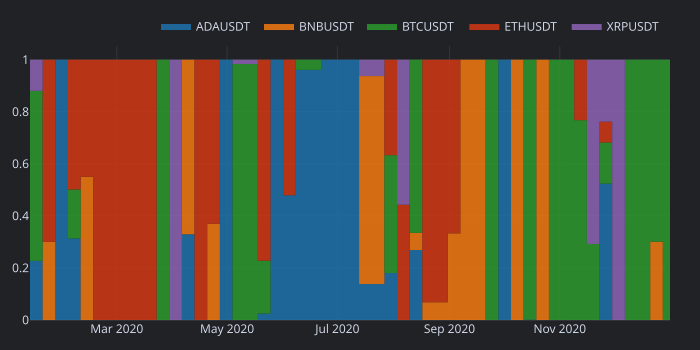

In [123]:
pfo = vbt.PortfolioOptimizer.from_riskfolio(
    returns=returns,
    every="W"
)

pfo.plot().show_svg()

In [124]:
pfo = vbt.PortfolioOptimizer.from_riskfolio(
    returns=returns,
    constraints=[{
        "Type": "Assets",
        "Position": "BTCUSDT",
        "Sign": "<=",
        "Weight": vbt.Param([0.1, 0.2, 0.3], name="BTCUSDT_maxw")
    }],
    every="W",
    param_search_kwargs=dict(incl_types=list)
)

  0%|          | 0/3 [00:02<?, ?it/s, BTCUSDT_maxw=0.1]

 92%|#########2| 47/51 [00:02<00:00, 23.30it/s, 2020-11-30 00:00 → 2020-12-06 23:00]

In [125]:
print(pfo.allocations.groupby("BTCUSDT_maxw").max())

symbol        ADAUSDT  BNBUSDT  BTCUSDT  ETHUSDT  XRPUSDT
BTCUSDT_maxw                                             
0.1               1.0      1.0      0.1      1.0      1.0
0.2               1.0      1.0      0.2      1.0      1.0
0.3               1.0      1.0      0.3      1.0      1.0


### Universal portfolios

In [126]:
from universal import tools, algos

with vbt.WarningsFiltered():
    algo = algos.CRP()
    algo_result = algo.run(data.get("Close"))
    
print(algo_result.weights)

ModuleNotFoundError: No module named 'universal'

In [ ]:
with vbt.WarningsFiltered():
    algo = algos.DynamicCRP(
        n=30, 
        min_history=7, 
        metric='sharpe', 
        alpha=0.01
    )
    algo_result = algo.run(data.get("Close").resample("D").last())
    down_weights = algo_result.weights
    
print(down_weights)

In [ ]:
weights = down_weights.vbt.realign(
    data.wrapper.index,
    freq="1h",
    source_rbound=True,
    target_rbound=True,
    ffill=False
)
print(weights)

In [ ]:
with vbt.WarningsFiltered():
    down_pfo = vbt.PortfolioOptimizer.from_universal_algo(
        "DynamicCRP",
        data.get("Close").resample("D").last(),
        n=vbt.Param([7, 14, 30, 90]), 
        min_history=7, 
        metric='sharpe', 
        alpha=0.01
    )

down_pfo.plot(column=90).show_svg()

In [ ]:
resampler = vbt.Resampler(
    down_pfo.wrapper.index, 
    data.wrapper.index, 
    target_freq="1h"
)
pfo = down_pfo.resample(resampler)

In [ ]:
pf = pfo.simulate(data, freq="1h")

pf.sharpe_ratio

#### Custom algorithm

In [ ]:
from universal.algo import Algo

class MeanReversion(Algo):
    PRICE_TYPE = 'log'
    
    def __init__(self, n):
        self.n = n
        super().__init__(min_history=n)
    
    def init_weights(self, cols):
        return pd.Series(np.zeros(len(cols)), cols)
    
    def step(self, x, last_b, history):
        ma = history.iloc[-self.n:].mean()
        delta = x - ma
        w = np.maximum(-delta, 0.)
        return w / sum(w)

In [ ]:
with vbt.WarningsFiltered():
    pfo = vbt.PortfolioOptimizer.from_universal_algo(
        MeanReversion,
        data.get("Close").resample("D").last(),
        n=30,
        every="W"
    )

pfo.plot().show_svg()

## Dynamic

In [ ]:
GroupMemory = namedtuple("GroupMemory", [
    "target_alloc", 
    "size_type",
    "direction",
    "order_value_out"
])

@njit
def pre_group_func_nb(c):
    group_memory = GroupMemory(
        target_alloc=np.full(c.group_len, np.nan),
        size_type=np.full(c.group_len, vbt.pf_enums.SizeType.TargetPercent),
        direction=np.full(c.group_len, vbt.pf_enums.Direction.Both),
        order_value_out=np.full(c.group_len, np.nan)
    )
    return group_memory,

@njit
def pre_segment_func_nb(
    c, 
    group_memory,
    min_history,
    threshold,
    allocate_func_nb,
    *args
):
    should_rebalance = False
    
    if c.i >= min_history:
        in_position = False
        for col in range(c.from_col, c.to_col):
            if c.last_position[col] != 0:
                in_position = True
                break
                
        if not in_position:
            should_rebalance = True
        else:
            curr_value = c.last_value[c.group]
            for group_col in range(c.group_len):
                col = c.from_col + group_col
                curr_position = c.last_position[col]
                curr_price = c.last_val_price[col]
                curr_alloc = curr_position * curr_price / curr_value
                curr_threshold = vbt.pf_nb.select_from_col_nb(c, col, threshold)
                alloc_diff = curr_alloc - group_memory.target_alloc[group_col]
                
                if abs(alloc_diff) >= curr_threshold:
                    should_rebalance = True
                    break
                    
    if should_rebalance:
        allocate_func_nb(c, group_memory, *args)
        vbt.pf_nb.sort_call_seq_1d_nb(
            c, 
            group_memory.target_alloc, 
            group_memory.size_type, 
            group_memory.direction, 
            group_memory.order_value_out
        )
        
    return group_memory, should_rebalance

@njit
def order_func_nb(
    c, 
    group_memory,
    should_rebalance, 
    price,
    fees
):
    if not should_rebalance:
        return vbt.pf_nb.order_nothing_nb()
    
    group_col = c.col - c.from_col
    return vbt.pf_nb.order_nb(
        size=group_memory.target_alloc[group_col], 
        price=vbt.pf_nb.select_nb(c, price),
        size_type=group_memory.size_type[group_col],
        direction=group_memory.direction[group_col],
        fees=vbt.pf_nb.select_nb(c, fees)
    )

In [ ]:
@njit
def uniform_allocate_func_nb(c, group_memory):
    for group_col in range(c.group_len):
        group_memory.target_alloc[group_col] = 1 / c.group_len

In [ ]:
def simulate_threshold_rebalancing(threshold, allocate_func_nb, *args, **kwargs):
    return vbt.Portfolio.from_order_func(
        data.get("Close"),
        open=data.get("Open"),
        pre_group_func_nb=pre_group_func_nb, 
        pre_group_args=(),
        pre_segment_func_nb=pre_segment_func_nb, 
        pre_segment_args=(
            0,
            vbt.Rep("threshold"),
            allocate_func_nb,
            *args
        ),
        order_func_nb=order_func_nb, 
        order_args=(vbt.Rep('price'), vbt.Rep('fees')),
        broadcast_named_args=dict(
            price=data.get("Close"),
            fees=0.005,
            threshold=threshold
        ),
        cash_sharing=True,
        group_by=vbt.ExceptLevel("symbol"),
        freq='1h', 
        **kwargs
    )

pf = simulate_threshold_rebalancing(0.05, uniform_allocate_func_nb)
pf.plot_allocations().show_svg()

In [ ]:
pf = simulate_threshold_rebalancing(
    vbt.Param(np.arange(1, 16) / 100, name="threshold"), 
    uniform_allocate_func_nb
)

pf.sharpe_ratio

### Post-analysis

In [ ]:
@njit
def track_uniform_allocate_func_nb(c, group_memory, index_points, alloc_counter):
    for group_col in range(c.group_len):
        group_memory.target_alloc[group_col] = 1 / c.group_len
    index_points[alloc_counter[0]] = c.i
    alloc_counter[0] += 1

index_points = np.empty(data.wrapper.shape[0], dtype=np.int_)
alloc_counter = np.full(1, 0)
pf = simulate_threshold_rebalancing(
    0.05,
    track_uniform_allocate_func_nb, 
    index_points, 
    alloc_counter
)
index_points = index_points[:alloc_counter[0]]

data.wrapper.index[index_points]

In [ ]:
@njit
def random_allocate_func_nb(
    c, 
    group_memory, 
    alloc_points, 
    alloc_weights, 
    alloc_counter
):
    weights = np.random.uniform(0, 1, c.group_len)
    group_memory.target_alloc[:] = weights / weights.sum()
    
    group_count = alloc_counter[c.group]
    count = alloc_counter.sum()
    alloc_points["id"][count] = group_count
    alloc_points["col"][count] = c.group
    alloc_points["alloc_idx"][count] = c.i
    alloc_weights[count] = group_memory.target_alloc
    alloc_counter[c.group] += 1

thresholds = pd.Index(np.arange(1, 16) / 100, name="threshold")
max_entries = data.wrapper.shape[0] * len(thresholds)
alloc_points = np.empty(max_entries, dtype=vbt.pf_enums.alloc_point_dt)
alloc_weights = np.empty((max_entries, len(data.symbols)), dtype=np.float_)
alloc_counter = np.full(len(thresholds), 0)

pf = simulate_threshold_rebalancing(
    vbt.Param(thresholds),
    random_allocate_func_nb, 
    alloc_points, 
    alloc_weights,
    alloc_counter,
    seed=42
)
alloc_points = alloc_points[:alloc_counter.sum()]
alloc_weights = alloc_weights[:alloc_counter.sum()]

In [ ]:
@njit
def random_allocate_func_nb(c, group_memory):
    weights = np.random.uniform(0, 1, c.group_len)
    group_memory.target_alloc[:] = weights / weights.sum()
    
    group_count = c.in_outputs.alloc_counter[c.group]
    count = c.in_outputs.alloc_counter.sum()
    c.in_outputs.alloc_points["id"][count] = group_count
    c.in_outputs.alloc_points["col"][count] = c.group
    c.in_outputs.alloc_points["alloc_idx"][count] = c.i
    c.in_outputs.alloc_weights[count] = group_memory.target_alloc
    c.in_outputs.alloc_counter[c.group] += 1

alloc_points = vbt.RepEval("""
    max_entries = target_shape[0] * len(group_lens)
    np.empty(max_entries, dtype=alloc_point_dt)
""", context=dict(alloc_point_dt=vbt.pf_enums.alloc_point_dt))
alloc_weights = vbt.RepEval("""
    max_entries = target_shape[0] * len(group_lens)
    np.empty((max_entries, n_cols), dtype=np.float_)
""", context=dict(n_cols=len(data.symbols)))
alloc_counter = vbt.RepEval("np.full(len(group_lens), 0)")

InOutputs = namedtuple("InOutputs", [
    "alloc_points",
    "alloc_weights",
    "alloc_counter"
])
in_outputs = InOutputs(
    alloc_points=alloc_points, 
    alloc_weights=alloc_weights,
    alloc_counter=alloc_counter,
)

pf = simulate_threshold_rebalancing(
    vbt.Param(np.arange(1, 16) / 100, name="threshold"),
    random_allocate_func_nb, 
    in_outputs=in_outputs,
    seed=42
)
alloc_points = pf.in_outputs.alloc_points[:pf.in_outputs.alloc_counter.sum()]
alloc_weights = pf.in_outputs.alloc_weights[:pf.in_outputs.alloc_counter.sum()]

In [ ]:
pfo = vbt.PortfolioOptimizer(
    wrapper=pf.wrapper,
    alloc_records=vbt.AllocPoints(
        pf.wrapper.resolve(), 
        alloc_points
    ),
    allocations=alloc_weights
)

In [ ]:
print(pfo[0.1].allocations.describe())

In [ ]:
pfo.plot(column=0.1).show_svg()

In [ ]:
pfo.plot(column=0.03).show_svg()

In [ ]:
pf[0.03].plot_allocations().show_svg()

In [ ]:
pf.sharpe_ratio

In [ ]:
pf_new = vbt.Portfolio.from_optimizer(
    data,
    pfo,  
    val_price=data.get("Open"), 
    freq="1h", 
    fees=0.005
)

pf_new.sharpe_ratio

### Bonus 1: Own optimizer

In [127]:
@njit(nogil=True)
def optimize_portfolio_nb(
    close, 
    val_price,
    range_starts,
    range_ends,
    optimize_func_nb,
    optimize_args=(),
    price=np.inf,
    fees=0.,
    init_cash=100.,
    group=0
):
    val_price_ = vbt.to_2d_array_nb(np.asarray(val_price))
    price_ = vbt.to_2d_array_nb(np.asarray(price))
    fees_ = vbt.to_2d_array_nb(np.asarray(fees))

    order_records = np.empty(close.shape, dtype=vbt.pf_enums.order_dt)
    order_counts = np.full(close.shape[1], 0, dtype=np.int_)
    
    order_value = np.empty(close.shape[1], dtype=np.float_)
    call_seq = np.empty(close.shape[1], dtype=np.int_)
    
    last_position = np.full(close.shape[1], 0.0, dtype=np.float_)
    last_debt = np.full(close.shape[1], 0.0, dtype=np.float_)
    last_locked_cash = np.full(close.shape[1], 0.0, dtype=np.float_)
    cash_now = float(init_cash)
    free_cash_now = float(init_cash)
    value_now = float(init_cash)

    for k in range(len(range_starts)):
        i = range_ends[k]
        size = optimize_func_nb(
            range_starts[k], 
            range_ends[k], 
            *optimize_args
        )
        
        value_now = cash_now
        for col in range(close.shape[1]):
            val_price_now = vbt.flex_select_nb(val_price_, i, col)
            value_now += last_position[col] * val_price_now
        
        for col in range(close.shape[1]):
            val_price_now = vbt.flex_select_nb(val_price_, i, col)
            exec_state = vbt.pf_enums.ExecState(
                cash=cash_now,
                position=last_position[col],
                debt=last_debt[col],
                locked_cash=last_locked_cash[col],
                free_cash=free_cash_now,
                val_price=val_price_now,
                value=value_now,
            )
            order_value[col] = vbt.pf_nb.approx_order_value_nb(
                exec_state,
                size[col],
                vbt.pf_enums.SizeType.TargetPercent,
                vbt.pf_enums.Direction.Both,
            )
            call_seq[col] = col

        vbt.pf_nb.insert_argsort_nb(order_value, call_seq)

        for c in range(close.shape[1]):
            col = call_seq[c]
            
            order = vbt.pf_nb.order_nb(
                size=size[col],
                price=vbt.flex_select_nb(price_, i, col),
                size_type=vbt.pf_enums.SizeType.TargetPercent,
                direction=vbt.pf_enums.Direction.Both,
                fees=vbt.flex_select_nb(fees_, i, col),
            )

            price_area = vbt.pf_enums.PriceArea(
                open=np.nan,
                high=np.nan,
                low=np.nan,
                close=vbt.flex_select_nb(close, i, col),
            )
            val_price_now = vbt.flex_select_nb(val_price_, i, col)
            exec_state = vbt.pf_enums.ExecState(
                cash=cash_now,
                position=last_position[col],
                debt=last_debt[col],
                locked_cash=last_locked_cash[col],
                free_cash=free_cash_now,
                val_price=val_price_now,
                value=value_now,
            )
            _, new_exec_state = vbt.pf_nb.process_order_nb(
                group=group,
                col=col,
                i=i,
                exec_state=exec_state,
                order=order,
                price_area=price_area,
                order_records=order_records,
                order_counts=order_counts
            )

            cash_now = new_exec_state.cash
            free_cash_now = new_exec_state.free_cash
            value_now = new_exec_state.value
            last_position[col] = new_exec_state.position
            last_debt[col] = new_exec_state.debt
            last_locked_cash[col] = new_exec_state.locked_cash

    return vbt.nb.repartition_nb(order_records, order_counts)

In [128]:
@njit(nogil=True)
def sharpe_optimize_func_nb(
    start_idx, 
    end_idx, 
    close, 
    num_tests, 
    ann_factor
):
    close_period = close[start_idx:end_idx]
    returns = (close_period[1:] - close_period[:-1]) / close_period[:-1]
    mean = vbt.nb.nanmean_nb(returns)
    cov = np.cov(returns, rowvar=False)
    best_sharpe_ratio = -np.inf
    weights = np.full(close.shape[1], np.nan, dtype=np.float_)
    
    for i in range(num_tests):
        w = np.random.random_sample(close.shape[1])
        w = w / np.sum(w)
        p_return = np.sum(mean * w) * ann_factor
        p_std = np.sqrt(np.dot(w.T, np.dot(cov, w))) * np.sqrt(ann_factor)
        sharpe_ratio = p_return / p_std
        if sharpe_ratio > best_sharpe_ratio:
            best_sharpe_ratio = sharpe_ratio
            weights = w
            
    return weights

In [129]:
range_starts, range_ends = data.wrapper.get_index_ranges(every="W")
ann_factor = vbt.timedelta("365d") / vbt.timedelta("1h")
init_cash = 100
num_tests = 30
fees = 0.005

order_records = optimize_portfolio_nb(
    data.get("Close").values,
    data.get("Open").values,
    range_starts,
    range_ends,
    sharpe_optimize_func_nb,
    optimize_args=(data.get("Close").values, num_tests, ann_factor),
    fees=fees,
    init_cash=init_cash
)

In [130]:
pf = vbt.Portfolio(
    wrapper=symbol_wrapper.regroup(True), 
    close=data.get("Close"), 
    order_records=order_records, 
    log_records=np.array([]), 
    cash_sharing=True, 
    init_cash=init_cash
)

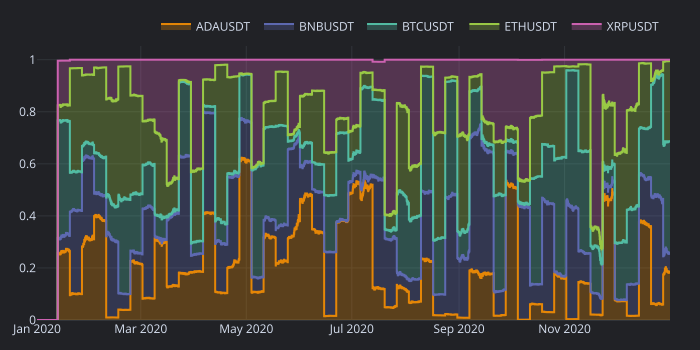

In [131]:
pf.plot_allocations().show_svg()

### Bonus 2: Parameterization

In [132]:
def merge_func(order_records_list, param_index):
    sharpe_ratios = pd.Series(index=param_index, dtype=np.float_)
    for i, order_records in enumerate(order_records_list):
        pf = vbt.Portfolio(
            wrapper=symbol_wrapper.regroup(True), 
            close=data.get("Close"), 
            order_records=order_records, 
            cash_sharing=True, 
            init_cash=init_cash
        )
        sharpe_ratios.iloc[i] = pf.sharpe_ratio
    return sharpe_ratios

In [133]:
param_optimize_portfolio_nb = vbt.parameterized(
    optimize_portfolio_nb, 
    merge_func=merge_func,
    merge_kwargs=dict(param_index=vbt.Rep("param_index")),
    engine="dask",
    chunk_len=4
)

In [134]:
every_index = pd.Index(["D", "W", "M"], name="every")
num_tests_index = pd.Index([30, 50, 100], name="num_tests")
fees_index = pd.Index([0.0, 0.005, 0.01], name="fees")

range_starts = []
range_ends = []
for every in every_index:
    index_ranges = symbol_wrapper.get_index_ranges(every=every)
    range_starts.append(index_ranges[0])
    range_ends.append(index_ranges[1])
num_tests = num_tests_index.tolist()

range_starts = vbt.Param(range_starts, level=0, keys=every_index)
range_ends = vbt.Param(range_ends, level=0, keys=every_index)
num_tests = vbt.Param(num_tests, level=1, keys=num_tests_index)
fees = vbt.Param(fees_index.values, level=2, keys=fees_index)

In [135]:
sharpe_ratios = param_optimize_portfolio_nb(
    data.get("Close").values,
    data.get("Open").values,
    range_starts,
    range_ends,
    sharpe_optimize_func_nb,
    optimize_args=(
        data.get("Close").values, 
        num_tests, 
        ann_factor
    ),
    fees=fees,
    init_cash=init_cash,
    group=vbt.Rep("config_idx")
)

 14%|#4        | 1/7 [00:02<00:16,  2.83s/it, chunk_calls=4..7]

In [136]:
sharpe_ratios

every  num_tests  fees 
D      30         0.000    2.142682
                  0.005    0.536163
                  0.010   -1.256230
       50         0.000    2.316521
                  0.005    0.383057
                  0.010   -1.330871
       100        0.000    2.106096
                  0.005    0.197041
                  0.010   -1.413970
W      30         0.000    2.442384
                  0.005    2.004310
                  0.010    1.751179
       50         0.000    2.160309
                  0.005    1.881207
                  0.010    1.761170
       100        0.000    2.388044
                  0.005    2.097262
                  0.010    1.920681
M      30         0.000    1.663290
                  0.005    1.650548
                  0.010    1.495960
       50         0.000    1.561795
                  0.005    1.454609
                  0.010    1.719295
       100        0.000    1.523369
                  0.005    1.541736
                  0.010    1.849407
dtyp

### Bonus 3: Hyperopt

In [137]:
def objective(kwargs):
    close_values = data.get("Close").values
    open_values = data.get("Open").values
    index_ranges = symbol_wrapper.get_index_ranges(every=kwargs["every"])
    order_records = optimize_portfolio_nb(
        close_values,
        open_values,
        index_ranges[0],
        index_ranges[1],
        sharpe_optimize_func_nb,
        optimize_args=(close_values, kwargs["num_tests"], ann_factor),
        fees=vbt.to_2d_array(kwargs["fees"]),
        init_cash=init_cash
    )
    pf = vbt.Portfolio(
        wrapper=symbol_wrapper.regroup(True), 
        close=data.get("Close"), 
        order_records=order_records, 
        log_records=np.array([]), 
        cash_sharing=True, 
        init_cash=init_cash
    )
    return -pf.sharpe_ratio

In [138]:
from hyperopt import fmin, tpe, hp

space = {
    "every": hp.choice("every", ["%dD" % n for n in range(1, 100)]),
    "num_tests": hp.quniform("num_tests", 5, 100, 1),
    "fees": hp.uniform('fees', 0, 0.05)
}

best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=30
)
best

100%|██████████| 30/30 [00:04<00:00,  6.31trial/s, best loss: -2.6403296737854496]


{'every': 71, 'fees': 0.020385176590431372, 'num_tests': 10.0}

### Bonus 4: Hybrid

In [139]:
def optimize_func(
    data, 
    index_slice, 
    temp_allocations, 
    temp_pfs, 
    threshold
):
    sub_data = data.iloc[index_slice]
    if len(temp_allocations) > 0:
        prev_allocation = sub_data.symbol_wrapper.wrap(
            [temp_allocations[-1]], 
            index=sub_data.wrapper.index[[0]]
        )
        prev_pfo = vbt.PortfolioOptimizer.from_allocations(
            sub_data.symbol_wrapper,
            prev_allocation
        )
        if len(temp_pfs) > 0:
            init_cash = temp_pfs[-1].cash.iloc[-1]
            init_position = temp_pfs[-1].assets.iloc[-1]
            init_price = temp_pfs[-1].close.iloc[-1]
        else:
            init_cash = 100.
            init_position = 0.
            init_price = np.nan
        prev_pf = prev_pfo.simulate(
            sub_data,
            init_cash=init_cash, 
            init_position=init_position,
            init_price=init_price
        )
        temp_pfs.append(prev_pf)
        should_rebalance = False
        curr_alloc = prev_pf.allocations.iloc[-1].values
        if (np.abs(curr_alloc - temp_allocations[-1]) >= threshold).any():
            should_rebalance = True
    else:
        should_rebalance = True
    n_symbols = len(sub_data.symbols)
    if should_rebalance:
        new_alloc = np.full(n_symbols, 1 / n_symbols)
    else:
        new_alloc = np.full(n_symbols, np.nan)
    temp_allocations.append(new_alloc)
    return new_alloc

pfs = []
allocations = []
pfopt = vbt.PortfolioOptimizer.from_optimize_func(
    data.symbol_wrapper,
    optimize_func,
    data,
    vbt.Rep("index_slice"),
    allocations,
    pfs,
    0.03,
    every="W"
)
pf = pfopt.simulate(data)

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to 'f9ff1b20-2015-4975-acf8-80cba92e9bf0'.

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to '674bd7ff-37bb-4568-b7c0-123c4b44c6df'.



  6%|5         | 3/51 [00:06<01:50,  2.31s/it, 2020-01-27 00:00 → 2020-02-02 23:00]

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to '8ff6e6c6-7e73-493c-a22e-cef495dbf335'.

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to 'e174f166-3fec-4549-8fe8-5b2dd8ee9f4e'.

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to '8b5112d8-743f-4326-b1bd-2af4ef709121'.

/home/jupyter/miniconda3/envs/vectorbtpro/lib/python3.10/site-packages/vectorbtpro/utils/pbar.py:227: UserWarning:

Two active progress bars share the same bar id 'group'. Setting bar id of the new progress bar to 'ff9cfb50-944d-4173-a

In [140]:
final_values = pd.concat(map(lambda x: x.value[[-1]], pfs))
final_values

/tmp/ipykernel_433997/1574363310.py:1: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Open time
2020-01-19 23:00:00+00:00    111.896648
2020-01-26 23:00:00+00:00    113.064017
2020-02-02 23:00:00+00:00    126.596706
2020-02-09 23:00:00+00:00    148.254437
2020-02-16 23:00:00+00:00    151.150104
2020-02-23 23:00:00+00:00    151.854653
2020-03-01 23:00:00+00:00    121.642543
2020-03-08 23:00:00+00:00    111.621933
2020-03-15 23:00:00+00:00     72.723659
2020-03-22 23:00:00+00:00     74.217566
2020-03-29 23:00:00+00:00     76.815467
2020-04-05 23:00:00+00:00     88.262229
2020-04-12 23:00:00+00:00     93.351682
2020-04-19 23:00:00+00:00    100.245859
2020-04-26 23:00:00+00:00    110.700666
2020-05-03 23:00:00+00:00    120.164683
2020-05-10 23:00:00+00:00    111.488422
2020-05-17 23:00:00+00:00    120.176268
2020-05-24 23:00:00+00:00    115.561238
2020-05-31 23:00:00+00:00    136.285688
2020-06-07 23:00:00+00:00    146.112433
2020-06-14 23:00:00+00:00    135.574876
2020-06-21 23:00:00+00:00    134.833384
2020-06-28 23:00:00+00:00    133.328262
2020-07-05 23:00:00+00:00    1

In [141]:
pd.testing.assert_series_equal(
    final_values,
    pf.value.loc[final_values.index],
)